# RV-Transit Joint Fit Example: GJ 3470 b

* This is a RV-Transit Joint Fit with the Rossiter Mclaughlin (RM) effect to test the RM fitting capabilities of ExoMUSE.
* This notebook is inspired by one of the tutorials of **`rmfit`**.
* The data for this notebook was also taken from **`rmfit`** data examples.
* **`rmfit`: https://github.com/gummiks/rmfit/**
* **Data origins: https://ui.adsabs.harvard.edu/abs/2022ApJ...931L..15S/abstract**

* Note that in this notebook due to memory issues, I won't be using sufficient MCMC steps.
* It is recommended to run this notebook for ~ 60000 MCMC steps with all of the light curve data.

## Importing ExoMUSE and required libraries

In [8]:
#We first use %matplotlib inline to display the plots in the notebook.
%matplotlib inline

In [9]:
#We then import the required libraries.
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize
from importlib import reload

import corner
import radvel

import os
import sys
import astropy.time

In [10]:
#We then import the ExoMUSE codes.
sys.path.insert(0, '../../ExoMUSE/')
try:
    sys.path.remove('\\wsl.localhost\\Ubuntu\\home\\kayahan')
except Exception as e:
    print(e)

#We import ExoMUSE_fit.py, ExoMUSE_utils.py, and ExoMUSE_gaiasource.py as standards.
import ExoMUSE_fit
import ExoMUSE_utils
import ExoMUSE_gaiasource

reload(ExoMUSE_fit)

ExoMUSE_fit, ExoMUSE_utils, ExoMUSE_gaiasource

list.remove(x): x not in list


(<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>,
 <module 'ExoMUSE_utils' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_utils.py'>,
 <module 'ExoMUSE_gaiasource' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_gaiasource.py'>)

In [11]:
#We also import rcParams to keep our plots consistent throughout various notebooks.
from matplotlib import rcParams

#We change the formating of the plots.
rcParams["axes.formatter.useoffset"] = False
rcParams['axes.formatter.limits'] = -15,15
rcParams['mathtext.fontset'] = 'stix'
rcParams['font.family'] = 'STIXGeneral'
rcParams['xtick.direction']='in'
rcParams['ytick.direction']='in'

## Data Input

In [12]:
#We import the datasets.
#Since this is a RV-Transit Joint Fit we import:
    #RV data
    #Transit Data

#We import the RV data.
df_rv = pd.read_csv("../../data/rvdata/GJ3470_RV_data.mrt", skiprows = 22,
                    header = None, delim_whitespace = True,
                    names = ["bjd", "rv", "e", "ntransit"])

df_rv = df_rv[df_rv["ntransit"] == 0]

#We also import the transit data.
df_tr = pd.read_csv("../../data/lcdata/GJ3470_LC.mrt", skiprows = 22,
                    header = None, delim_whitespace = True,
                    names = ["bjd", "f", "e", "model", "gp", "ntransit"])

df_tr = df_tr[df_tr["ntransit"] == 1]

#We can now combine all of the datasets into a dictionary as an input for the likelihood function.
df = {"time_rv1": df_rv["bjd"].values,
      "rv_rv1": df_rv["rv"].values,
      "e_rv1": df_rv["e"].values,
      "time_tr1": df_tr["bjd"].values,
      "f_tr1": df_tr["f"].values,
      "e_tr1": df_tr["e"].values}

df

{'time_rv1': array([2459216.853771, 2459216.861036, 2459216.868301, 2459216.875566,
        2459216.882831, 2459216.890096, 2459216.897361, 2459216.904626,
        2459216.911891, 2459216.919156, 2459216.926421, 2459216.933687,
        2459216.940952, 2459216.948217, 2459216.955482, 2459216.962747,
        2459216.970012, 2459216.977277, 2459216.984542, 2459216.991807,
        2459216.999072, 2459217.006337]),
 'rv_rv1': array([-1.  ,  2.32,  0.64,  4.67, -0.56, -3.01, -0.34,  0.7 , -1.08,
        -0.69, -1.44, -0.53, -1.68,  0.63, -0.95, -0.34,  1.46,  2.14,
        -1.69, -1.47, -0.2 ,  0.37]),
 'e_rv1': array([1.94, 1.76, 1.67, 1.69, 1.77, 1.62, 1.57, 1.59, 1.51, 1.46, 1.44,
        1.44, 1.54, 1.58, 1.59, 1.55, 1.67, 1.77, 1.78, 1.88, 1.9 , 2.  ]),
 'time_tr1': array([2458819.784088, 2458819.78431 , 2458819.784532, 2458819.784754,
        2458819.784976, 2458819.785198, 2458819.785421, 2458819.785643,
        2458819.785865, 2458819.786311, 2458819.786534, 2458819.786756,
        2

## Setting up the Priors 

In [13]:
#We then import the Prior file for the RV-Transit Joint Fit for 3 Instruments (FCO).
f = "../../data/lcrvpriors/GJ3470_PriorsRVLC.txt"

reload(ExoMUSE_fit)

<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>

## Setting up the Log-Likelihood

In [14]:
#We then use "LPFunctionRMTransit" for the Transit-Only Fit.
    #"LPFunction" => Log-Likelihood Function
    #"RM" => RV Fit with RM effect
    #"Transit" => Transit Fit

#We setup our Log-Likelihood Function by using the dataset and the prior file.
#LPFunctionRMTransit takes the dictionary of the datasets that we have defined previously.
#Note that this function prints out the Priors.
L = ExoMUSE_fit.LPFunctionRMTransit(df, file_priors = f)

Reading in priorfile from ../../data/lcrvpriors/GJ3470_PriorsRVLC.txt
   prior          arg1        arg2            label      description  \
0     NP  2.456341e+06    0.000100            t0_p1            t0_p1   
1     NP  3.336653e+00    0.000003             P_p1             P_p1   
2     UP -1.800000e+02  180.000000           lam_p1           lam_p1   
3     UP  0.000000e+00   10.000000            vsini            vsini   
4     UP  8.000000e+01   90.000000           inc_p1           inc_p1   
5     UP  0.000000e+00    0.200000             p_p1             p_p1   
6     UP  5.000000e+00   30.000000             a_p1             a_p1   
7     NP  3.500000e-01    0.100000           u1_rv1           u1_rv1   
8     NP  3.200000e-01    0.050000           u2_rv1           u2_rv1   
9     NP  3.500000e-01    0.100000           u1_tr1           u1_tr1   
10    NP  3.200000e-01    0.050000           u2_tr1           u2_tr1   
11    NP  1.250000e-01    0.042000           ecc_p1           ecc_

In [15]:
#We then define a fitting object by using the Log-Likelihood as follows.
TF = ExoMUSE_fit.ExoMUSEfitRM(L)

## Setting up the MCMC run

In [16]:
#For the MCMC, we use pyDE and emcee.
#We use pyDE to find the initial points for the chains.
#We then use emcee.EnsembleSampler to run the MCMC chains.
#This is all done by .minimize_pyDE() function from ExoMUSE_Fit.
    #de_iter => Differential Evolution iterations, used for the distribution of walkers.
        #To distribute better, we increase de_iter.
        #However, this would increase the initial optimization time.
    #mc_iter => MCMC iterations, used for the number of steps in the chains.
        #We can evaluate the chains using GR Statistic and/or Autocorrelation time.
        #Depending on the evaluations, we can increase the mc_iter.
        #However, this will of course increase the time of the MCMC run.

TF.minimize_PyDE(de_iter=2000,mc_iter=20000,)

Running PyDE Optimizer
Optimized using PyDE
Final parameters:
          labels       centers         lower         upper            pv   center_dist
0          t0_p1  2.456341e+06  2.456341e+06  2.456341e+06  2.456341e+06 -1.238659e-07
1           P_p1  3.336653e+00  3.336637e+00  3.336669e+00  3.336652e+00  8.021615e-07
2         lam_p1  0.000000e+00 -1.800000e+02  1.800000e+02  1.094483e+02 -1.094483e+02
3          vsini  5.000000e+00  0.000000e+00  1.000000e+01  5.096078e-01  4.490392e+00
4         inc_p1  8.500000e+01  8.000000e+01  9.000000e+01  8.791038e+01 -2.910375e+00
5           p_p1  1.000000e-01  0.000000e+00  2.000000e-01  8.091701e-02  1.908299e-02
6           a_p1  1.750000e+01  5.000000e+00  3.000000e+01  1.373713e+01  3.762866e+00
7         u1_rv1  3.500000e-01 -1.500000e-01  8.500000e-01  3.401450e-01  9.855039e-03
8         u2_rv1  3.200000e-01  7.000000e-02  5.700000e-01  3.177153e-01  2.284666e-03
9         u1_tr1  3.500000e-01 -1.500000e-01  8.500000e-01  2.714652

## Flattening the Chains

In [17]:
#We can define the burn-in period to be the first 2000 steps.
#This means that we will discard the first 2000 samples from each chain.
burnin_index = 2000

#We then discard the first 2000 samples from all of the chains as follows.
    #First part: We take all the chains.
    #Second part: We discard the first 2000 samples per chain.
    #Third part: We take all the parameters that were in the MCMC run.
chains_after_burnin = TF.sampler.chain[ : , burnin_index : , : ]

#We then have to reshape the chains to obtain the flatchain as follows.
    #TF.lpf => ExoMUSE_fit.LPFunctionRVTransit3Instruments
    #.ps_vary => The Prior Set of the parameters that vary (from priors.py)
    #.priors => The priors of the varying parameters.
flatchain = chains_after_burnin.reshape((-1, len(TF.lpf.ps_vary.priors)))

In [18]:
#To store the posteriors from the flatchain, we can define a pandas DataFrame.
    #This time TF.lpf.ps_vary.labels takes the name of the varying parameters.
df_post = pd.DataFrame(flatchain, columns = TF.lpf.ps_vary.labels)

df_post

,t0_p1,P_p1,lam_p1,vsini,inc_p1,p_p1,a_p1,u1_rv1,u2_rv1,u1_tr1,u2_tr1,ecc_p1,omega_p1,vbeta,K_p1,gamma_rv1,mflux_tr1,mfluxdot_tr1
0,2.456341e+06,3.336652,109.709641,0.825082,88.673668,0.079990,15.604588,0.270696,0.251016,0.282167,0.316281,0.161438,-82.228755,3.220255,7.824858,0.856049,1.001013,0.021487
1,2.456341e+06,3.336652,109.413035,0.852087,88.693897,0.080053,15.650546,0.260559,0.246964,0.282904,0.310495,0.162267,-82.298819,3.238489,7.834312,0.897182,1.001018,0.021575
2,2.456341e+06,3.336652,109.413035,0.852087,88.693897,0.080053,15.650546,0.260559,0.246964,0.282904,0.310495,0.162267,-82.298819,3.238489,7.834312,0.897182,1.001018,0.021575
3,2.456341e+06,3.336652,109.413035,0.852087,88.693897,0.080053,15.650546,0.260559,0.246964,0.282904,0.310495,0.162267,-82.298819,3.238489,7.834312,0.897182,1.001018,0.021575
4,2.456341e+06,3.336652,109.404962,0.852509,88.694500,0.080049,15.652600,0.260374,0.247002,0.282956,0.310541,0.162354,-82.293587,3.237466,7.833833,0.896226,1.001018,0.021573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1799995,2.456341e+06,3.336652,108.258143,0.629406,88.283306,0.079339,13.847774,0.335049,0.330294,0.312076,0.334579,0.054794,-80.663446,2.834490,7.955362,0.414185,1.001026,0.023862
1799996,2.456341e+06,3.336652,108.258143,0.629406,88.283306,0.079339,13.847774,0.335049,0.330294,0.312076,0.334579,0.054794,-80.663446,2.834490,7.955362,0.414185,1.001026,0.023862
1799997,2.456341e+06,3.336652,108.258143,0.629406,88.283306,0.079339,13.847774,0.335049,0.330294,0.312076,0.334579,0.054794,-80.663446,2.834490,7.955362,0.414185,1.001026,0.023862
1799998,2.456341e+06,3.336652,110.524527,0.385185,88.111976,0.079572,13.475295,0.333501,0.338619,0.309090,0.332719,0.042682,-80.078984,2.718290,8.022474,0.233135,1.001043,0.024365


## Assessing the Chains

In [19]:
#To check and assess the chains, we can use mcmc_help.
import mcmc_help

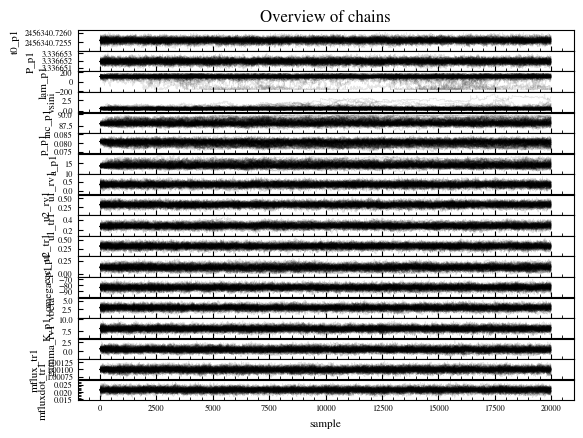

In [20]:
#We use the plot_chains function from the mcmc_help module to plot the chains.
#Note that TF.sampler is equivalent to an emcee.EnsembleSampler object.
mcmc_help.plot_chains(TF.sampler.chain, labels = TF.lpf.ps_vary.labels)

plt.show();

In [21]:
#We can also check the Gelman-Rubin (GR) Statistic to evaluate the chains of each parameter.
#We want the GR statistic to be within 1% of unity => The results should be 1 to 1.01
print("GR Statistics:")
print(50 * "-")
print(mcmc_help.gelman_rubin(chains_after_burnin))
print(50 * "-")

GR Statistics:
--------------------------------------------------
[1.01794382 1.02026098 1.10455012 1.15541215 1.07172145 1.04675413
 1.04818036 1.01913215 1.01285003 1.03001976 1.01302188 1.02398439
 1.014454   1.01597809 1.01058669 1.02037056 1.01753348 1.01663075]
--------------------------------------------------


In [22]:
#We can also check the autocorrelation time of the chains.
#If the chain isn't long enough, we would get the following error:
    #The chain is shorter than 50 times the integrated autocorrelation time for x parameter(s).
    #Use this estimate with caution and run a longer chain: N/50 = 40

try:
    print(50 * "-")
    print("Autocorrelation Time")
    print(50 * "-")
    tau = TF.sampler.get_autocorr_time()
    print(tau)

    #We can also divide the length of the chain by the autocorrelation time to get the number of s
    #independent samples.
    print(50 * "-")
    print("Number of Independent Samples")
    print(50 * "-")
    N_eff = len(flatchain) / tau
    print(N_eff)
    print(50 * "-")
    
except Exception as e:
    print("Error calculating the autocorrelation time:", e)
print(50 * "-")


--------------------------------------------------
Autocorrelation Time
--------------------------------------------------
Error calculating the autocorrelation time: The chain is shorter than 50 times the integrated autocorrelation time for 10 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 400;
tau: [398.07705733 380.29876948 619.14954809 578.19417551 772.149454
 691.38945037 675.92536245 405.78065783 363.28029136 536.48211223
 353.85006571 518.25192164 376.19151829 385.49776568 376.8450847
 515.00598471 409.11059227 382.96713743]
--------------------------------------------------


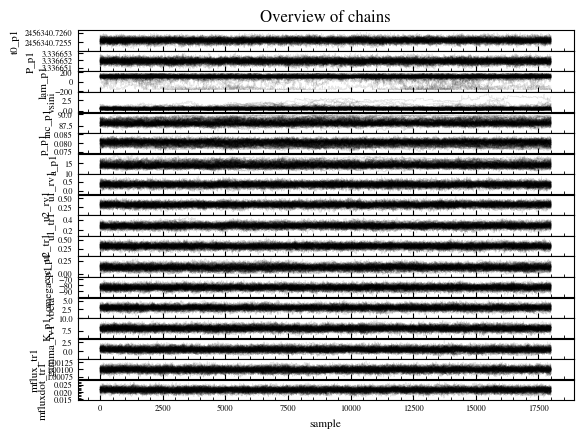

In [23]:
#We can also check how the flatchains look by plotting the flatchains.
mcmc_help.plot_chains(chains_after_burnin, labels = TF.lpf.ps_vary.labels)
plt.show();

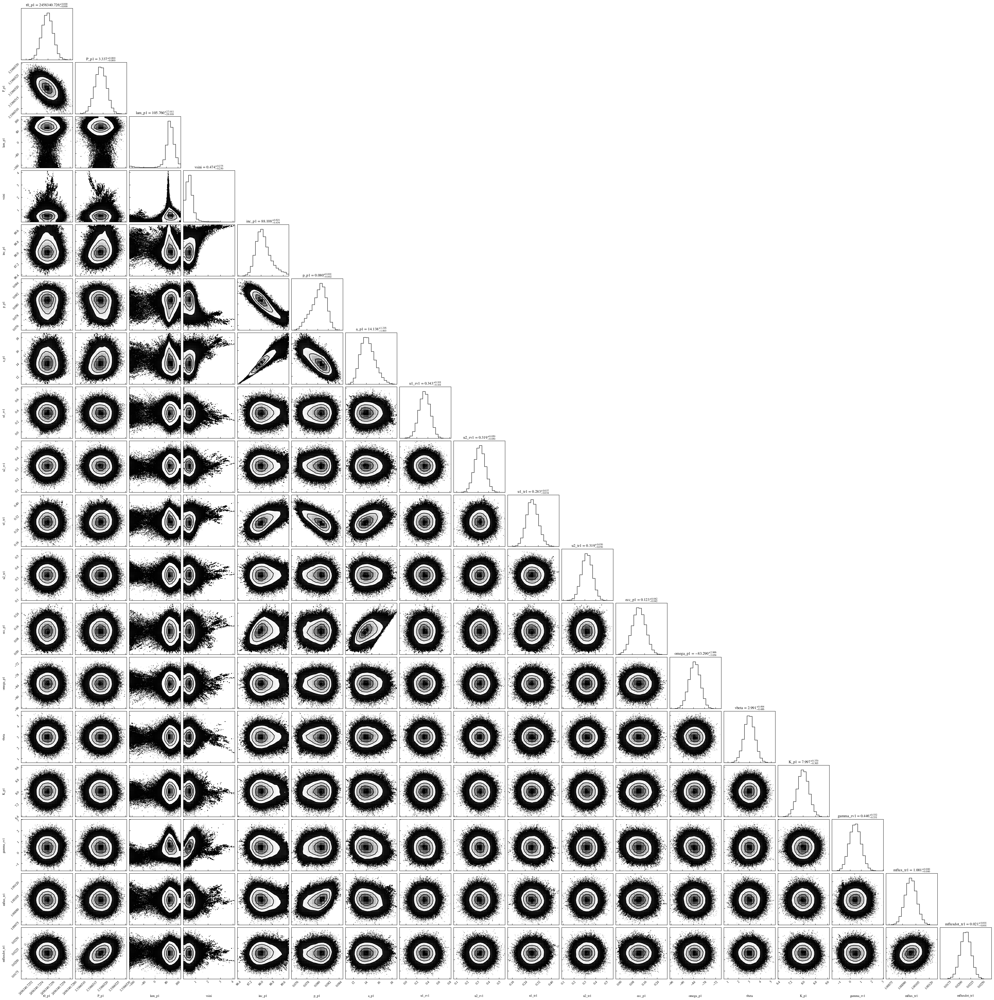

In [24]:
#We can also plot the corner plot to see the correlations and the posterior distributions
#of each parameter that was in the MCMC run.
fig = corner.corner(df_post.iloc[:,:].values,
       show_titles=True,labels=list(df_post.iloc[:,:].columns),title_fmt='.3f',xlabcord=(0.5, -0.2));

plt.show();

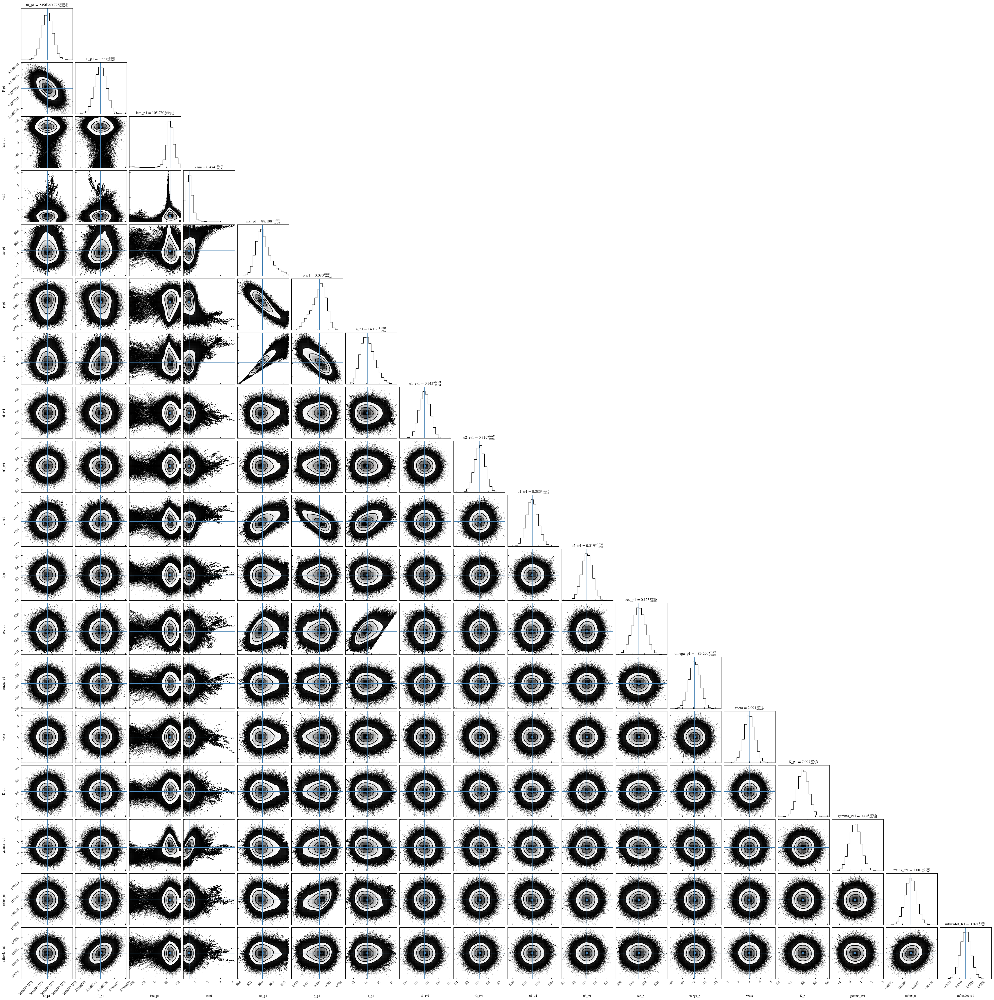

In [25]:
#We can also plot the corner plot with 50th percentile, i.e., the median to see whether
#the posterior distributions are sampled correctly or not.
#We first find the median of each parameter.
pv_50 = np.percentile(flatchain,[50],axis=0)[0]

#We then plot the corner plot and the median.
corner.corner(df_post.iloc[:, :].values,truths=pv_50,
       show_titles=True,labels=list(df_post.iloc[:, :].columns),title_fmt='.3f',xlabcord=(0.5, -0.2));

plt.show();

## Working with the Posteriors

In [26]:
#We can obtain the median and uncertainties of each parameter by using the
#.get_mean_values_mcmc_posteriors() function from ExoMUSE_fit.LPFunctionRVTransit3Instruments.
df_medvals = TF.get_mean_values_mcmc_posteriors(df_post.values)

df_medvals

,medvals,minus,plus,values,Labels,Description
0,2.456341e+06,9.932369e-05,9.976560e-05,$2456340.725588_{-0.00010}^{+0.00010}$,t0_p1,t0_p1
0,3.336652e+00,2.592766e-07,2.557784e-07,$3.33665189_{-0.0000003}^{+0.0000003}$,P_p1,P_p1
0,1.057597e+02,2.691644e+01,2.701062e+01,$106.0_{-27.0}^{+27.0}$,lam_p1,lam_p1
0,4.740824e-01,2.500254e-01,2.748189e-01,$0.47_{-0.25}^{+0.27}$,vsini,vsini
0,8.810834e+01,4.342982e-01,6.206991e-01,$88.11_{-0.43}^{+0.62}$,inc_p1,inc_p1
0,8.036426e-02,1.654820e-03,1.156761e-03,$0.0804_{-0.0017}^{+0.0012}$,p_p1,p_p1
0,1.413824e+01,1.003383e+00,1.215812e+00,$14.1_{-1.0}^{+1.2}$,a_p1,a_p1
0,3.426909e-01,1.014443e-01,1.011496e-01,$0.34_{-0.10}^{+0.10}$,u1_rv1,u1_rv1
0,3.186604e-01,4.988521e-02,4.964858e-02,$0.319_{-0.050}^{+0.050}$,u2_rv1,u2_rv1
0,2.832238e-01,3.393477e-02,3.672933e-02,$0.283_{-0.034}^{+0.037}$,u1_tr1,u1_tr1


In [27]:
df_medvals[["Labels", "values"]]

,Labels,values
0,t0_p1,$2456340.725588_{-0.00010}^{+0.00010}$
0,P_p1,$3.33665189_{-0.0000003}^{+0.0000003}$
0,lam_p1,$106.0_{-27.0}^{+27.0}$
0,vsini,$0.47_{-0.25}^{+0.27}$
0,inc_p1,$88.11_{-0.43}^{+0.62}$
0,p_p1,$0.0804_{-0.0017}^{+0.0012}$
0,a_p1,$14.1_{-1.0}^{+1.2}$
0,u1_rv1,$0.34_{-0.10}^{+0.10}$
0,u2_rv1,$0.319_{-0.050}^{+0.050}$
0,u1_tr1,$0.283_{-0.034}^{+0.037}$


## Plotting the Data and the Best-Fit Model

In [62]:
#We first define the Title and the amount of times we will sample the model.
TITLE = "GJ 3470 RV-Transit Joint Fit"
NUM_SAMPLES = 5000

In [63]:
reload(ExoMUSE_fit)

<module 'ExoMUSE_fit' from '/home/kaya/ExoMUSE/notebooks/rv-lc-tests/../../ExoMUSE/ExoMUSE_fit.py'>

### Plotting the Data and the Best-Fit Model over Time

#### Working with RV Data

In [64]:
#We first start with the RV data.

#We can plot the data and the best-fit model over time.
    #Optional: If there we want to convert Julian Dates into Datetimes, i.e. DD-MM-YYYY format,
    #we can use ExoMUSE_utils.jd2datetime(times) function, where times is in Julian Dates.

#For this, we first get the times from our dataset.
times_data_rv = TF.lpf.data_rv1["time"]

print("Times Data RV:", times_data_rv)

Times Data RV: [2459216.853771 2459216.861036 2459216.868301 2459216.875566
 2459216.882831 2459216.890096 2459216.897361 2459216.904626
 2459216.911891 2459216.919156 2459216.926421 2459216.933687
 2459216.940952 2459216.948217 2459216.955482 2459216.962747
 2459216.970012 2459216.977277 2459216.984542 2459216.991807
 2459216.999072 2459217.006337]


#### Working with Transit Data

In [65]:
#We do the same for the Transit data.
#For this, we first get the times from our dataset.
times_data_tr = TF.lpf.data_tr1["time"]

print("Times Data Transit:", times_data_tr)

Times Data Transit: [2458819.784088 2458819.78431  2458819.784532 2458819.784754
 2458819.784976 2458819.785198 2458819.785421 2458819.785643
 2458819.785865 2458819.786311 2458819.786534 2458819.786756
 2458819.786978 2458819.787203 2458819.787425 2458819.787647
 2458819.787869 2458819.788091 2458819.788313 2458819.788535
 2458819.788757 2458819.788979 2458819.789201 2458819.78943
 2458819.789656 2458819.789878 2458819.790101 2458819.790324
 2458819.790546 2458819.790769 2458819.790991 2458819.791213
 2458819.791436 2458819.791658 2458819.79188  2458819.792102
 2458819.792324 2458819.792556 2458819.792778 2458819.793
 2458819.793446 2458819.793668 2458819.793891 2458819.794113
 2458819.794335 2458819.794557 2458819.794779 2458819.795001
 2458819.795224 2458819.795446 2458819.795668 2458819.79589
 2458819.796112 2458819.796334 2458819.796556 2458819.796788
 2458819.79701  2458819.797233 2458819.797458 2458819.79768
 2458819.797902 2458819.798135 2458819.798357 2458819.798579
 2458819.7

#### Computing the best fit models

In [66]:
#For the case of RM Effect fitting, we need to compute the transit and RV models at the same time.
#We first get the medians of the parameters by using the flatchain.
#This again can be obtained by checking the 50th percentile of the flatchains.
pv_50 = np.percentile(flatchain, [50], axis=0)[0]

#We then define the amount of times where we will sample the Best-Fit Model, which is a time range starting from the earliest observation to the latest observation.
times_model_rv = np.linspace(TF.lpf.data_rv1['time'][0]-0.02,TF.lpf.data_rv1['time'][-1]+0.02,5000)
times_model_tr = np.linspace(times_data_tr.min(), times_data_tr.max(), NUM_SAMPLES)

#We then compute the best-fit models for all instruments by using the median values and defined times.
#For this, we use compute_total_model.
rv_model, tr_model= TF.lpf.compute_total_model(pv_50, times_rv1 = times_model_rv, times_tr1 = times_model_tr)

#We also compute the radial velocity data from the model at the observation times.
rv_data_from_model, tr_data_from_model = TF.lpf.compute_total_model(pv_50, times_rv1 = times_data_rv, times_tr1 = times_data_tr)

#From here, we can calculate the residuals, i.e., DATA - MODEL
residuals_rv = TF.lpf.data_rv1["y"] - rv_data_from_model
residuals_tr = TF.lpf.data_tr1["y"] - tr_data_from_model

print("Residuals for RV:", residuals_rv)
print("Residuals for Transit:", residuals_tr)

Residuals for RV: [-2.34222575  1.06400892 -0.52972795  3.5865562  -0.93783532 -2.26112371
  0.64790752  1.75554317 -0.02623633  0.3223055  -0.49630282  0.32223654
 -0.9446631   1.20268467 -0.80238574 -0.38817246  1.49685006  2.26266423
 -1.48160904 -1.17597687  0.17955363  0.83497533]
Residuals for Transit: [-5.78226854e-06  1.00459031e-04 -5.72299669e-04 -3.90583792e-05
 -1.24981708e-03  7.87424220e-04  2.08164408e-03  8.70885369e-04
  1.29312667e-03 -4.61433613e-04  1.48278625e-03 -1.10297245e-03
  1.73268845e-04 -2.09655417e-03  9.24687123e-04  1.69992842e-03
 -1.21883028e-03  2.05411012e-04  1.16565231e-03 -1.17810639e-03
 -6.62865099e-04  8.73376201e-04  6.08617501e-04  5.29708745e-04
  6.08642920e-05  1.85610559e-03  1.36932545e-03 -2.69454690e-04
 -1.14721339e-03 -2.22993531e-04  5.33247768e-04 -6.22510942e-04
 -9.43291073e-04  1.22395022e-03  2.54191517e-04  1.19432806e-04
  5.78674106e-04  1.91070105e-03  2.52942348e-04 -2.70816362e-04
  1.35262336e-03 -6.31353443e-05 -8.0991

#### Plotting the RV-Transit Joint Fit

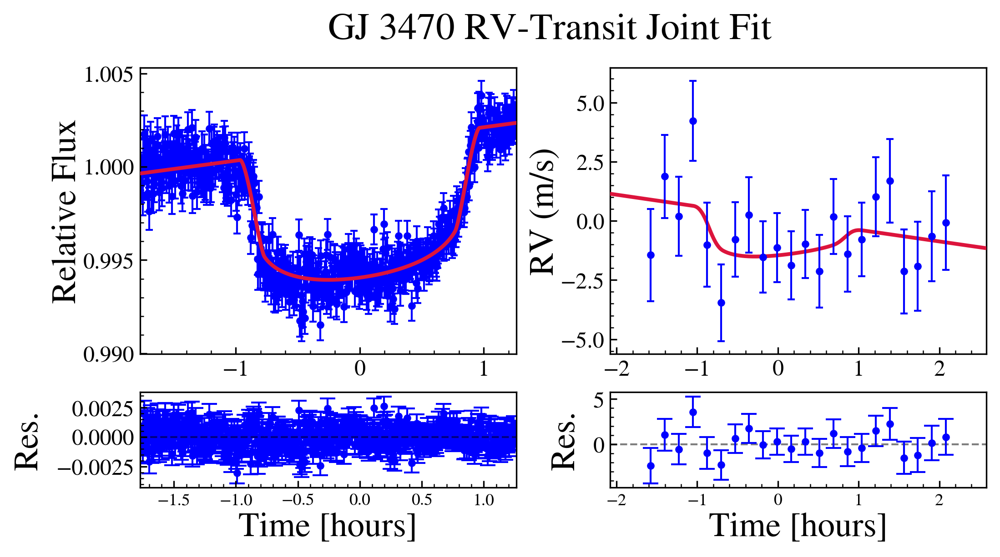

In [67]:
#We then plot our data.
#For this we define 2 rows and columns to show both RV and Transit fit.
    #One of the columns will have two rows: One of them for the Flux and Best-Fit model, other for the residuals.
    #The other column will also have two rows: One of them for the RV and Best-Fit model, other for the residuals. 
fig, ((ax_tr, ax_rv), (bx_tr, bx_rv)) = plt.subplots(dpi=300, nrows=2, ncols=2, gridspec_kw={"height_ratios": [3, 1]}, figsize = (8,4))

#We also will normalize the times to make a clear plot.
#For this, we pull the P and T0 from our fit results.
P = df_medvals.medvals.values[df_medvals.Labels == "P_p1"][0]
T0 = df_medvals.medvals.values[df_medvals.Labels == "t0_p1"][0]

################################################################ TRANSIT PLOTTING #################################################################

#We first add the sigma_tr uncertainty to the Transit data. (Kept fixed on this run)
uncertainty_sigma_tr = 0.0
inflated_tr_err = np.sqrt(pow(TF.lpf.data_tr1["error"], 2) + pow(uncertainty_sigma_tr, 2))

#We normalize the transit times.
normalized_time_tr = (TF.lpf.data_tr1["time"] - ExoMUSE_fit.transit_time_from_ephem(df['time_tr1'][0],P,T0)) * 24
normalized_time_model_tr = (times_model_tr - ExoMUSE_fit.transit_time_from_ephem(df['time_tr1'][0],P,T0)) * 24

#We plot the Transit data.
ax_tr.errorbar(normalized_time_tr, TF.lpf.data_tr1["y"], 
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - Transit', zorder = -100)

#We then plot the best-fit model for the Transit data.
ax_tr.plot(normalized_time_model_tr, tr_model_1, color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the Transit data.
bx_tr.errorbar(normalized_time_tr, residuals_tr,
               yerr = inflated_tr_err, marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, zorder = -100)

#We set the labels and titles for the Transit plot.
ax_tr.set_ylabel('Relative Flux', labelpad=0, fontsize=18)
bx_tr.set_xlabel('Time [hours]', labelpad=2, fontsize=18)
bx_tr.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_tr = (normalized_time_tr.min(), normalized_time_tr.max())
ax_tr.set_xlim(xlim_tr[0], xlim_tr[-1])

#We do the same for y limit.
ylim_tr = ax_tr.get_ylim()
ax_tr.set_ylim(ylim_tr[0] + 0, ylim_tr[-1] + 0)

#We also plot the zero-line for the residuals.
time_res = np.linspace(xlim_tr[0], xlim_tr[-1], 100)
bx_tr.plot(time_res, 0 * np.ones(100), color='black', ls='--', lw=1, alpha=0.5, zorder=-10)
bx_tr.set_xlim(xlim_tr[0], xlim_tr[-1])

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

################################################################ RV PLOTTING #################################################################

#We first add the sigma_rv uncertainties to the RV datasets.
# uncertainty_sigma_rv1 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv1"].values[0]
# uncertainty_sigma_rv2 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv2"].values[0]
# uncertainty_sigma_rv3 = df_medvals["medvals"][df_medvals["Labels"] == "sigma_rv3"].values[0]

#This time, the sigma_rv uncertainties were kept fixed.
uncertainty_sigma_rv = 0.0
inflated_rv_err = np.sqrt(pow(TF.lpf.data_rv1["error"], 2) + pow(uncertainty_sigma_rv, 2))

#We also normalize the RV times.
normalized_time_rv = (TF.lpf.data_rv1["time"] - ExoMUSE_fit.transit_time_from_ephem(df['time_rv1'][0],P,T0)) * 24
normalized_time_model_rv = (times_model_rv - ExoMUSE_fit.transit_time_from_ephem(df['time_rv1'][0],P,T0)) * 24

#We then plot the RV data for each night.
#Note that we need to subtract the systematic velocities from each of the RV points to center them around the zero line.
ax_rv.errorbar(normalized_time_rv, TF.lpf.data_rv1["y"]-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), yerr = inflated_rv_err,
               marker='.', elinewidth=1, capsize=2, lw=0, mew=1, color="blue",
               markersize=6, label='Data - RV', zorder = 100)

#We then plot the best-fit model for the RV data.
#In here, since we are plotting with the RV model of the first dataset, we remove the systematic velocity of the first dataset to get it centered around the zero line.
ax_rv.plot(normalized_time_model_rv, rv_model_1-TF.lpf.get_jump_parameter_value(pv_50,'gamma_rv1'), color="crimson", label = "Best-Fit Model", lw=2., zorder=10)

#We then plot the residuals for the RV data.
bx_rv.errorbar(normalized_time_rv, residuals_rv, yerr = inflated_rv_err, 
               marker='.', elinewidth=1, capsize=4, lw=0, mew=1, color="blue",
               markersize=6, label='Residuals - RV', zorder = 100)

#We plot the uncertainty intervals by using rv_models_for_uncertainty.
# #1 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 16, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 84, axis=0),
#                 color='#EE2C2C', alpha=0.3)
# #2 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 2, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 98, axis=0),
#                 color='#EE2C2C', alpha=0.2)
# #3 Sigma Interval
# ax_rv.fill_between(times_model, 
#                 np.percentile(rv_models_for_uncertainty, 0.15, axis=0),
#                 np.percentile(rv_models_for_uncertainty, 99.85, axis=0),
#                 color='#EE2C2C', alpha=0.1)

#We set the labels and titles for the RV plot.
ax_rv.set_ylabel('RV (m/s)', labelpad=0, fontsize=18)
bx_rv.set_xlabel('Time [hours]', labelpad=2, fontsize=18)
bx_rv.set_ylabel('Res.', labelpad=6, fontsize=18)

#We get the x limit and then set a new limit.
xlim_rv = (normalized_time_rv.min()-0.5, normalized_time_rv.max()+0.5)
ax_rv.set_xlim(xlim_rv[0],xlim_rv[1])

#We do the same for y limit.
ylim_rv = ax_rv.get_ylim()
ax_rv.set_ylim(ylim_rv[0], ylim_rv[-1])

#We define additional times to plot the zero-line for residuals.
time_res_rv = np.linspace(xlim_rv[0] ,xlim_rv[-1], 100)
bx_rv.plot(time_res_rv,0*np.ones(100),color='black',ls='--',lw=1,alpha=0.5,zorder=-10)
bx_rv.set_xlim(xlim_rv[0],xlim_rv[1])

#We set 0.02 horizontal space between 2 rows of plots.
fig.subplots_adjust(hspace=0.02)

#We apply the settings to the axes.
for xx in [ax_tr, ax_rv, bx_tr, bx_rv]:
    ExoMUSE_utils.ax_apply_settings(xx)
    xx.grid(lw=0)

bx_tr.tick_params(axis = 'x', labelsize = 9)
bx_rv.tick_params(axis = 'x', labelsize = 9)

fig.suptitle(TITLE, fontsize=20)

fig.subplots_adjust(hspace=0.2, wspace=0.25)

plt.show();